**Pressione SHIFT+ENTER para executar a célula**

# Alegrete

Este notebook fornece algumas visualizações para o trabalho de regressão linear. Para conseguir usar, implemente as funções no seu `alegrete.py` e tenha as bibliotecas `numpy` e `matplotlib` instaladas.

O notebook usa um conjunto de dados sintetico. Adapte-o para carregar e usar os dados do `alegrete.csv`.

### Imports das bibliotecas de plot e da solucao implementada

In [ ]:
%matplotlib inline
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import alegrete
import pandas as pd


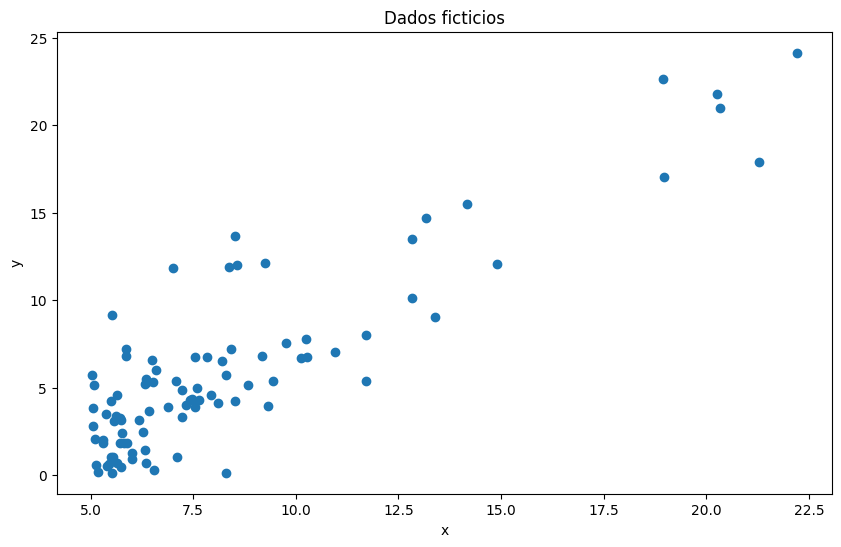

In [ ]:
dataset = pd.read_csv('alegrete.csv')
array = np.array(dataset, dtype=float)
x = array[:, 0] #primeira coluna do array
y = array[:, 1] #segunda coluna do array

#Visualização dos dados por meio do grafico
plt.figure(figsize=(10, 6))
plt.scatter(x, y)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Dados ficticios')
plt.show()

### Visualizacao dos dados

### Execucao da regressao linear e calculo do EQM por epoca/iteracao

Considere o parâmetro b o coeficiente linear (theta_0, visto em aula) e w o coeficiente angular (theta_1, visto em aula).

EQM final: 6.477844810893934


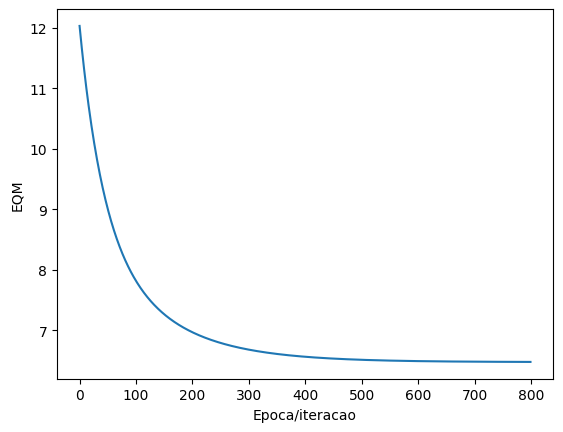

In [ ]:
b_history, w_history = alegrete.fit(
    dataset, b= 0, w=1,
    alpha=0.0117, num_iterations= 800)

# valores finais de theta0 e theta1
final_b, final_w = b_history[-1], w_history[-1]

mse_list = [alegrete.compute_mse(b, w, dataset) for b, w in zip(b_history, w_history)]
print(f"EQM final: {mse_list[-1]}")


plt.plot(mse_list)
plt.xlabel('Epoca/iteracao')
plt.ylabel('EQM')
plt.show()

### Plot da curva final

Curva encontrada: 1.1695572054725012*x + -3.652380553688476


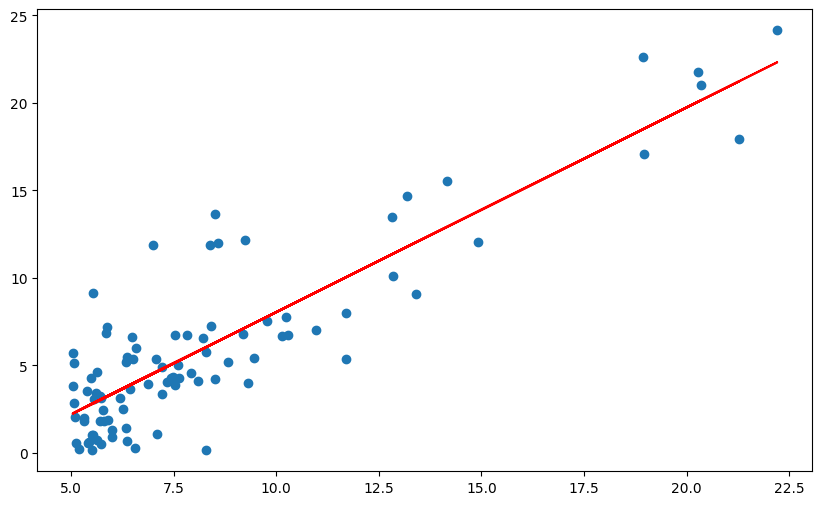

In [ ]:
#Imprimir parâmetros otimizados
print (f'Curva encontrada: {final_w}*x + {final_b}')

#x = dataset.iloc[:, 0] #primeira coluna do array
#y = dataset.iloc[:, 1] #segunda coluna do array

#plota os dados
plt.figure(figsize=(10, 6))
plt.scatter(x, y)

# plota a curva de ajuste
pred = final_w*x + final_b
plt.plot(x, pred, c='r')
plt.show()


### Progresso da descida do gradiente com o número de iterações

Execute a celula e use os controles abaixo do grafico para visualizar o progresso do seu ajuste

Pode aparecer um grafico "extra" abaixo da animacao, apenas ignore.

/tmp/ipython-input-1700375871.py:21: UserWarning: You passed in an explicit save_count=50 which is being ignored in favor of frames=500.
  ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=100, save_count=50)


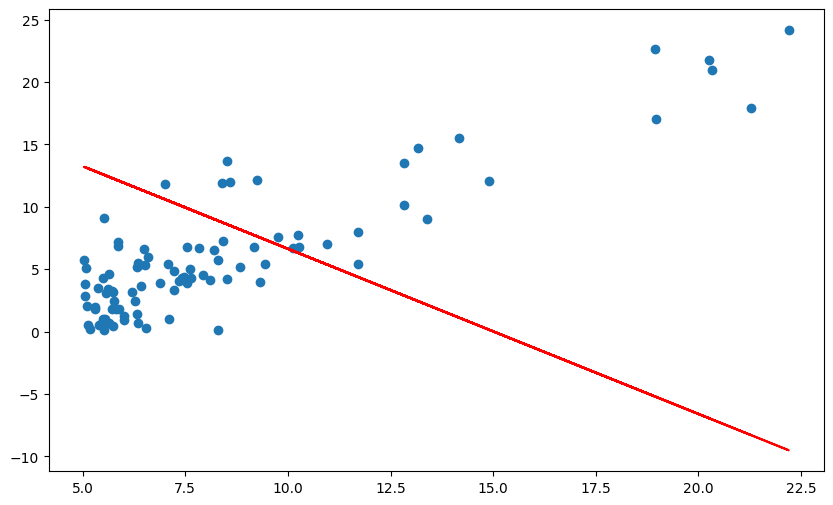

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)

#x = dataset.iloc[:, 0] #primeira coluna do array
#y = dataset.iloc[:, 1] #segunda coluna do array

# conjunto de dados
ax.scatter(x, y)

# linha com os valores iniciais dos parametros
pred = w_history[0]*x + b_history[0]
line, = ax.plot(x, pred, '-',c='r')

# funcao que atualiza a linha a cada passo
def animate(i):
    pred = w_history[i] * x + b_history[i]
    line.set_ydata(pred)
    return line,

# mude interval para trocar a velocidade da animacao
ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=100, save_count=50)
HTML(ani.to_jshtml())